In [1]:
include("../lib/show_image.jl")
include("../lib/show_compression.jl")
include("../src/Lab_3.jl")

using FileIO, Colors, ImageCore, ImageShow, ImageMagick

using .Lab_3.create_tree
using .show_image
using .show_image
using .show_compression

In [2]:
function count_leaves(v)
    isempty(v.sons) ? 1 : sum(count_leaves, v.sons)
end

count_leaves (generic function with 1 method)

In [16]:
img = load("test.jpeg")
img_gray = Gray.(img)
img_gray = Float64.(img_gray)

rgb = channelview(img)
C = channelview(rgb)
R = Float64.(C[1, :, :])
G = Float64.(C[2, :, :])
B = Float64.(C[3, :, :])

img_rgb = RGB.(img)
hsv = HSV.(img_rgb)
C_hsv = channelview(hsv)
H = Float64.(C_hsv[1, :, :])
S = Float64.(C_hsv[2, :, :])
V = Float64.(C_hsv[3, :, :])

lab = Lab.(img_rgb)
C_lab = channelview(lab)
L = Float64.(C_lab[1, :, :])
a = Float64.(C_lab[2, :, :])
b = Float64.(C_lab[3, :, :])

768×1024 Matrix{Float64}:
 10.685    10.7015   10.7015   10.685    …   25.6383    26.7152   26.6791
 10.7518   10.7349   10.7015   10.685        26.0053    25.6853   27.1513
 10.8211   10.7861   10.7349   10.7015       25.9428    26.1309   26.1309
 10.8748   10.8211   10.7689   10.7518       24.8368    24.7627   26.1309
  9.97164   9.93754   9.9041    9.9041       25.3094    25.206    24.9897
 10.0064    9.98895   9.97164   9.95451  …   24.0393    24.1399   25.0628
  9.92889   9.91103   8.77507   8.75937      24.3419    23.9432   23.9213
  9.98357   9.96516   8.807     8.75937      23.6616    23.3383   23.9079
  9.03565   9.01862   9.00177   8.96862      21.797     21.989    23.0533
  9.00177   9.00177   8.98511   8.95231      20.408     20.468    21.7184
  ⋮                                      ⋱                       
 -7.35713  -7.43363  -6.40963  -4.27355     -12.6304   -16.6014  -19.0953
 -6.48525  -5.54378  -4.34422  -3.24147  …  -11.5961   -15.5698  -17.8233
 -4.51398  -2.90653 

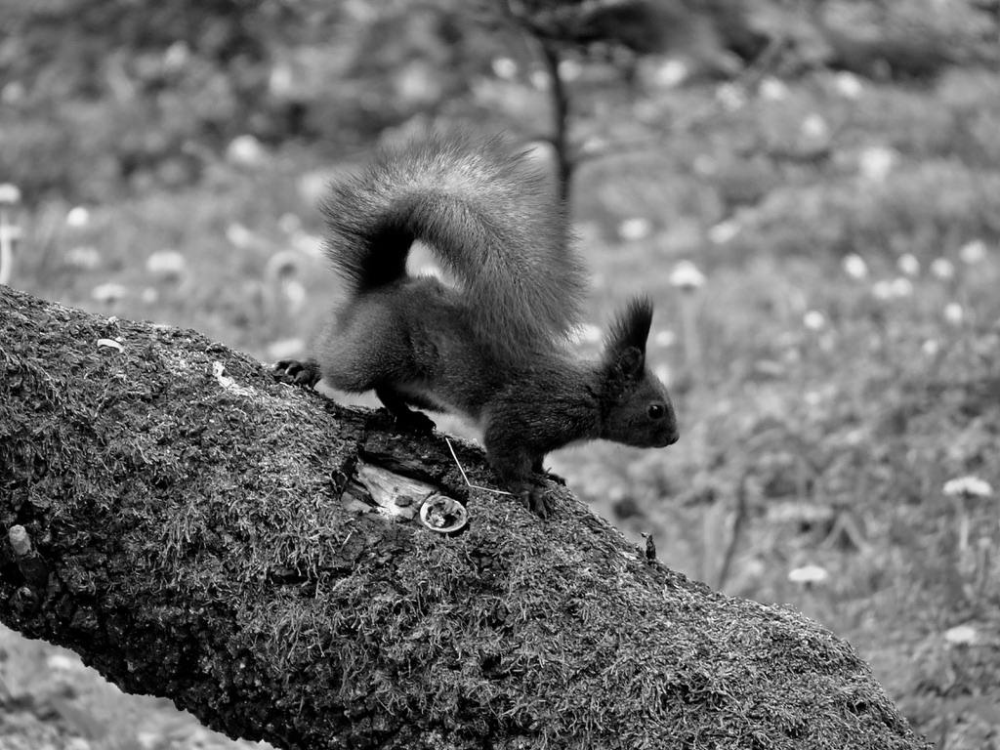

In [17]:
show_grey(img_gray, savepath="original_gray.png")

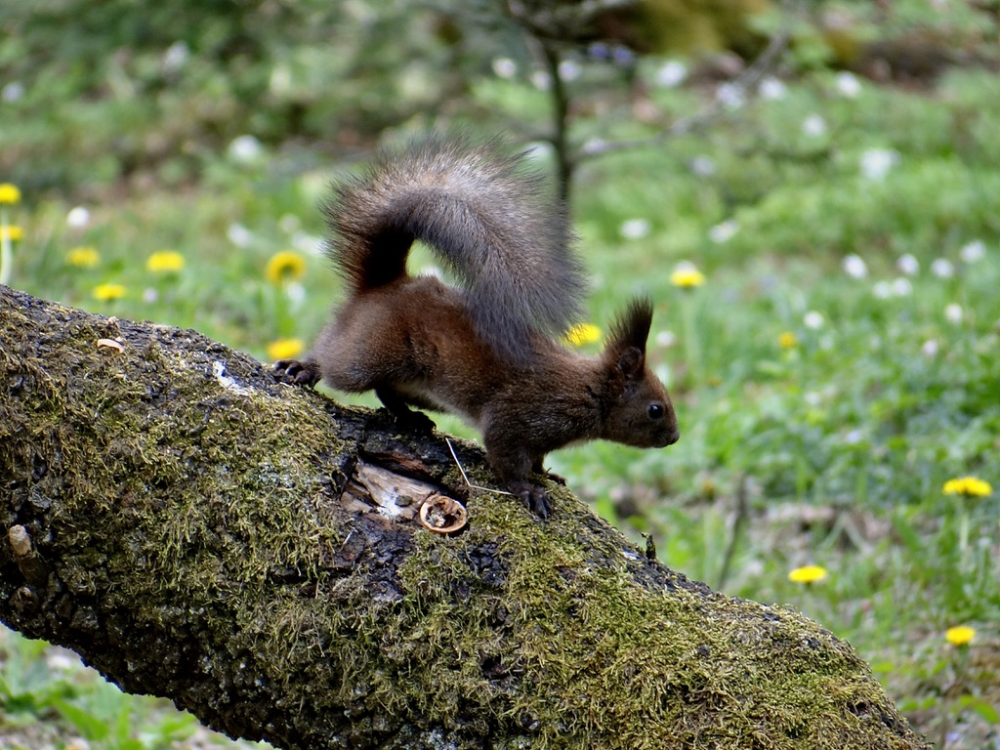

In [18]:
show_color(R, G, B; space=:rgb, savepath="original_color.png")

In [20]:
max_depth = 3
max_error = 10.0
ncols, nrows = size(img_gray)
compressed_gray = compression_tree(img_gray, 1, ncols, 1, nrows, max_depth, max_error)

Main.Lab_3.tree_node.TreeNode{Float64}(-1, (1, 768, 1, 1024), Float64[], Matrix{Float64}(undef, 0, 0), Matrix{Float64}(undef, 0, 0), Main.Lab_3.tree_node.TreeNode{Float64}[Main.Lab_3.tree_node.TreeNode{Float64}(-1, (1, 384, 1, 512), Float64[], Matrix{Float64}(undef, 0, 0), Matrix{Float64}(undef, 0, 0), Main.Lab_3.tree_node.TreeNode{Float64}[Main.Lab_3.tree_node.TreeNode{Float64}(3, (1, 192, 1, 256), [96.3370357074277, 11.071882513182306, 8.681701136066222], [0.056847528552567854 0.0955747534360138 0.041673464905210296; 0.056088277230805894 0.09915209445371218 0.043617132255108895; … ; 0.07926746090610325 -0.0963142074445008 0.024774705881855492; 0.08000655473373135 -0.09018068415343385 0.02858195310037832], [6.128684612085958 6.21866400900668 … 5.982943139023055 5.983364296312706; 0.43107427903735596 0.48244217367797565 … -1.9610924447717213 -1.9338058389885198; 0.7956332486986023 0.7043063462161777 … 0.5982175666208769 0.550493698858687], Main.Lab_3.tree_node.TreeNode{Float64}[]), Mai

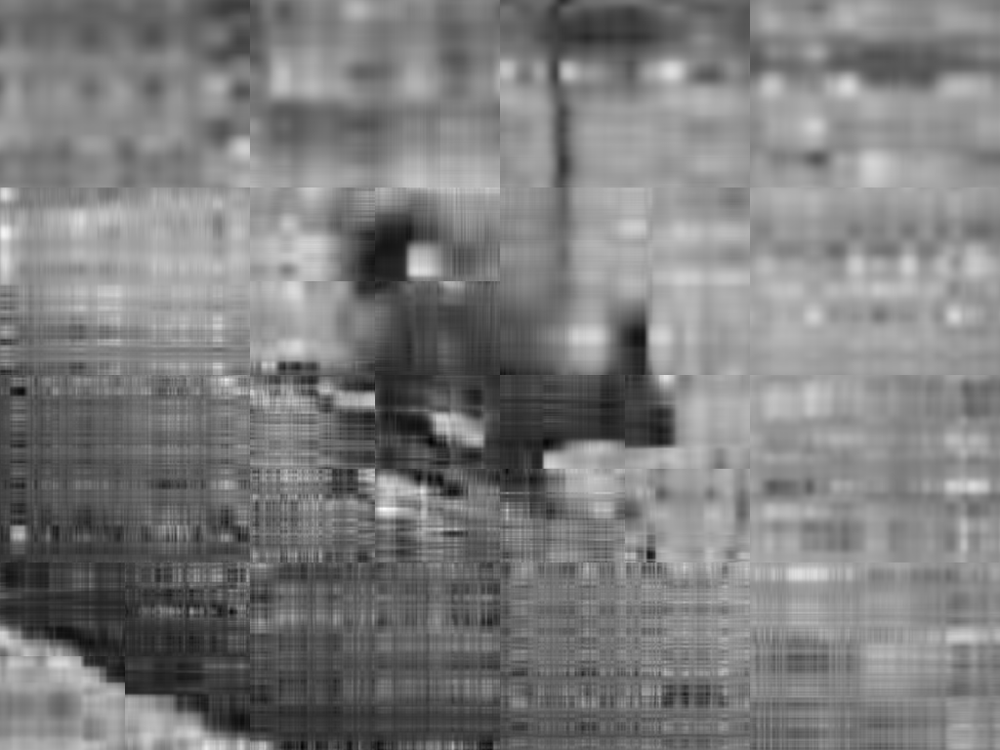

In [21]:
show_grey(compressed_gray, savepath="compressed_gray.png")

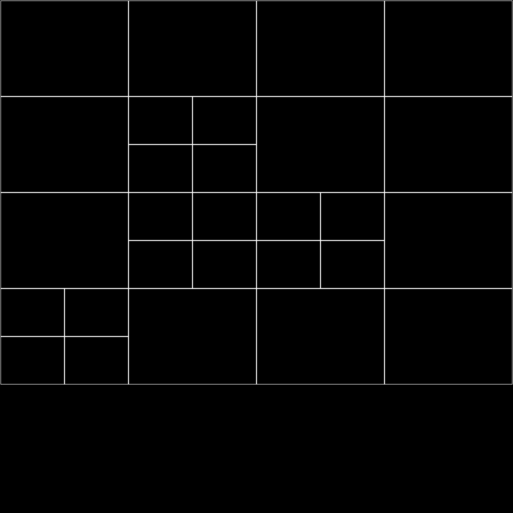

In [22]:
show_comp(compressed_gray, savepath="compression_gray.png")

In [23]:
println("original matrix size:   ", size(img_gray))
println("compressed tree covers: ", compressed_gray.size)

original matrix size:   (768, 1024)
compressed tree covers: (1, 768, 1, 1024)


In [24]:
println("number of leaves:       ", count_leaves(compressed_gray))
println("image size:            ", prod(size(img_gray)))
println("compression ratio:      ", prod(size(img_gray)) / count_leaves(compressed_gray))

number of leaves:       28
image size:            786432
compression ratio:      28086.85714285714


In [122]:
compressed_R = compression_tree(R, 1, ncols, 1, nrows, max_depth+2, max_error)
compressed_G = compression_tree(G, 1, ncols, 1, nrows, max_depth, max_error)
compressed_B = compression_tree(B, 1, ncols, 1, nrows, max_depth, max_error)

Main.Lab_3.tree_node.TreeNode{Float64}(-1, (1, 768, 1, 1024), Float64[], Matrix{Float64}(undef, 0, 0), Matrix{Float64}(undef, 0, 0), Main.Lab_3.tree_node.TreeNode{Float64}[Main.Lab_3.tree_node.TreeNode{Float64}(-1, (1, 384, 1, 512), Float64[], Matrix{Float64}(undef, 0, 0), Matrix{Float64}(undef, 0, 0), Main.Lab_3.tree_node.TreeNode{Float64}[Main.Lab_3.tree_node.TreeNode{Float64}(3, (1, 192, 1, 256), [71.93309776859076, 11.974981630756469, 8.415443084892972], [0.0546523967540708 0.06088084167222667 0.1330448357090563; 0.053619814864706794 0.06445239515557 0.1282903730789221; … ; 0.07898832099612706 -0.07167123974993228 -0.0715692822502787; 0.07854916389409897 -0.07074049199576674 -0.0769169489657574], [4.444116093651028 4.535233422038709 … 4.622749615862487 4.6044600182619115; 0.2797612769419977 0.3540291801864337 … -2.49887853077223 -2.4538760709136063; 0.08176672171416162 0.13947403567734737 … 0.18112629225814705 0.2339474264024032], Main.Lab_3.tree_node.TreeNode{Float64}[]), Main.Lab

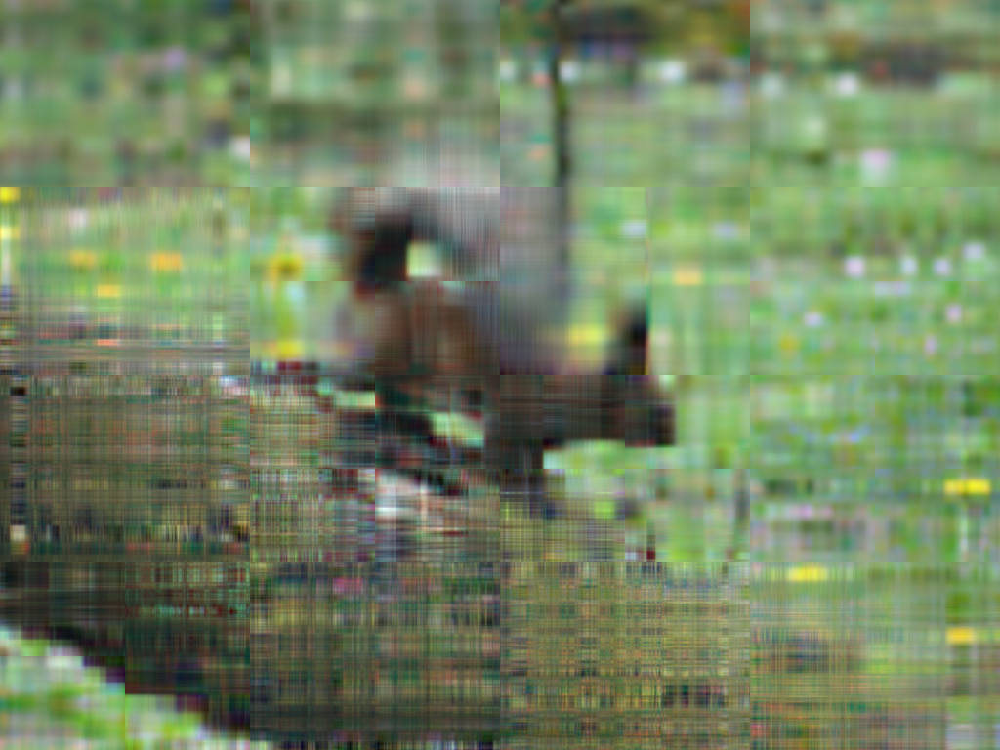

In [123]:
show_color(compressed_R, compressed_G, compressed_B; space=:rgb, savepath="compressed_color.png")

In [102]:
compressed_H = compression_tree(H, 1, ncols, 1, nrows, max_depth, max_error)
compressed_S = compression_tree(S, 1, ncols, 1, nrows, max_depth, max_error)
compressed_V = compression_tree(V, 1, ncols, 1, nrows, max_depth, max_error)

Main.Lab_3.tree_node.TreeNode{Float64}(-1, (1, 768, 1, 1024), Float64[], Matrix{Float64}(undef, 0, 0), Matrix{Float64}(undef, 0, 0), Main.Lab_3.tree_node.TreeNode{Float64}[Main.Lab_3.tree_node.TreeNode{Float64}(-1, (1, 384, 1, 512), Float64[], Matrix{Float64}(undef, 0, 0), Matrix{Float64}(undef, 0, 0), Main.Lab_3.tree_node.TreeNode{Float64}[Main.Lab_3.tree_node.TreeNode{Float64}(3, (1, 192, 1, 256), [104.26658900860177, 11.755825486050195, 9.109987733643315], [0.05799643426385179 0.09484379156950037 0.02432478339236861; 0.05730906306709094 0.09812318095636603 0.02586116430736112; … ; 0.07855102480152146 -0.09356183041476537 0.04133872405962856; 0.07930228275413265 -0.08597363279856395 0.045239984099905164], [6.650325472479473 6.741851660995069 … 6.45006867773507 6.460465349813668; 0.5494317784924251 0.5885144918954145 … -2.0342408533495373 -2.0096571410924025; 0.7972732501491615 0.706592637309635 … 0.7121318674025142 0.6624755142826964], Main.Lab_3.tree_node.TreeNode{Float64}[]), Main.

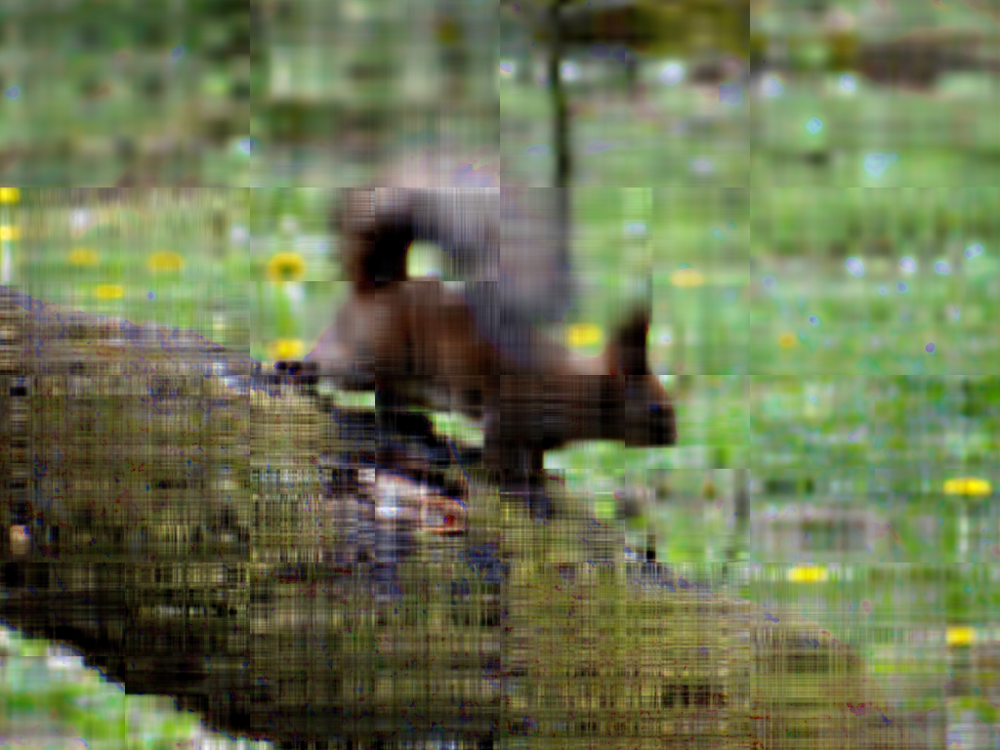

In [103]:
show_color(compressed_H, compressed_S, compressed_V; space=:hsv, savepath="compressed_color_hsv.png")

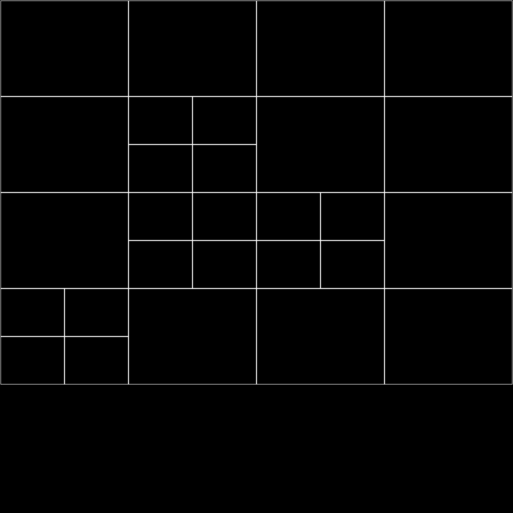

In [97]:
show_comp(compressed_V, savepath=nothing)

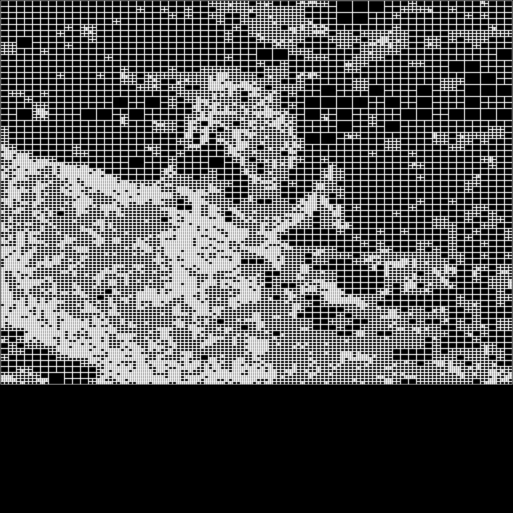

In [98]:
show_comp(compressed_H, savepath=nothing)

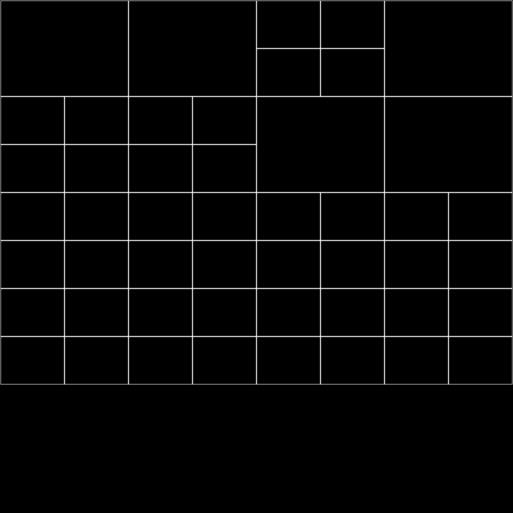

In [99]:
show_comp(compressed_S, savepath=nothing)

In [33]:
compressed_L = compression_tree(L, 1, ncols, 1, nrows, max_depth, max_error)
compressed_a = compression_tree(a, 1, ncols, 1, nrows, max_depth, max_error)
compressed_b = compression_tree(b, 1, ncols, 1, nrows, max_depth, max_error)

Main.Lab_3.tree_node.TreeNode{Float64}(-1, (1, 768, 1, 1024), Float64[], Matrix{Float64}(undef, 0, 0), Matrix{Float64}(undef, 0, 0), Main.Lab_3.tree_node.TreeNode{Float64}[Main.Lab_3.tree_node.TreeNode{Float64}(-1, (1, 384, 1, 512), Float64[], Matrix{Float64}(undef, 0, 0), Matrix{Float64}(undef, 0, 0), Main.Lab_3.tree_node.TreeNode{Float64}[Main.Lab_3.tree_node.TreeNode{Float64}(-1, (1, 192, 1, 256), Float64[], Matrix{Float64}(undef, 0, 0), Matrix{Float64}(undef, 0, 0), Main.Lab_3.tree_node.TreeNode{Float64}[Main.Lab_3.tree_node.TreeNode{Float64}(-1, (1, 96, 1, 128), Float64[], Matrix{Float64}(undef, 0, 0), Matrix{Float64}(undef, 0, 0), Main.Lab_3.tree_node.TreeNode{Float64}[Main.Lab_3.tree_node.TreeNode{Float64}(-1, (1, 48, 1, 64), Float64[], Matrix{Float64}(undef, 0, 0), Matrix{Float64}(undef, 0, 0), Main.Lab_3.tree_node.TreeNode{Float64}[Main.Lab_3.tree_node.TreeNode{Float64}(3, (1, 24, 1, 32), [360.82433214558756, 21.624286442188897, 13.867100169056727], [0.20274226695688624 0.1761

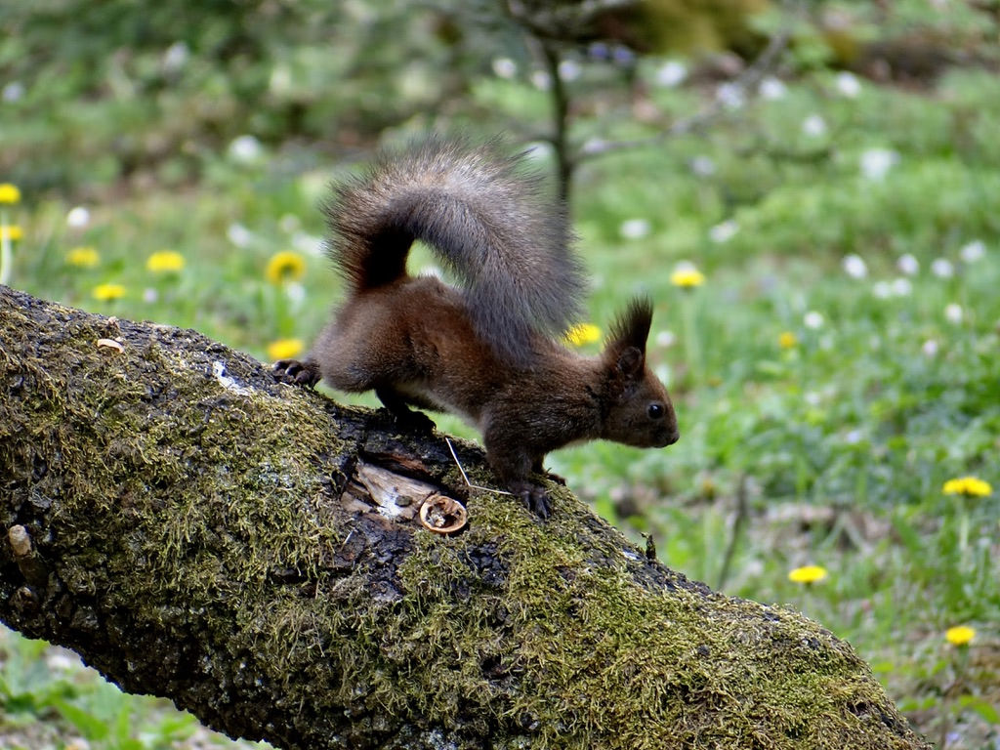

In [34]:
show_color(compressed_L, compressed_a, compressed_b; space=:lab, savepath="compressed_color_lab.png")

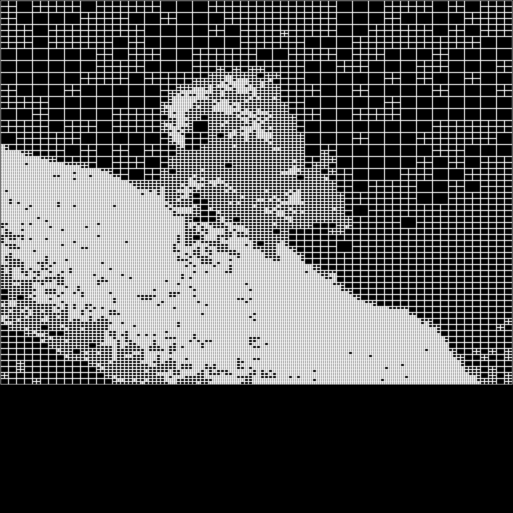

In [35]:
show_comp(compressed_L, savepath=nothing)